# Nuages de mots

In [19]:
import os
import re
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import nltk
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
import numpy as np

# Téléchargement NLTK
nltk.download("punkt", quiet=True)
nltk.download("stopwords", quiet=True)

data_path = "../../data/txt_tp4"
output_dir = "../../data/results/"
os.makedirs(output_dir, exist_ok=True)


In [21]:
sw = set(stopwords.words("french"))

# Stopwords élargis
stopwords_custom = sw | {
    "bruxelles","soir","matin","hier","demain","samedi","dimanche","lundi","mardi","mercredi",
    "jeudi","vendredi","rossel","belga","afp","tél","programme","adresse","heures","etc",
    "comme","sans","tous","grand","fait","très","non","aussi","ans","encore","avant","depuis",
    "peu","ainsi","autre","année","peut","toute","moins","vers","quelques","avoir",
    "service","bonne","lieu","jeunes",

    # culture → bruit
    "musique","orchestre","théâtre","cinéma","film","concert","exposition","spectacle","bd",
    "galerie","artiste","scène",

    # géographie
    "ville","rue","quartier","gare","transport","bus","train","parking",

    # politique
    "pays","gouvernement","ministre","élection","parti","réunion","budget","banque",

    # génériques
    "homme","vie","cas","problème","question","moment","type","genre",

    # artefacts
    "adm","gar","xii","xix","xx","xxx",

    # prénoms
    "jean","pierre","marie","jacques","michel","paul"
}

# Mots-cibles à conserver même s'ils sont dans les stopwords
mots_cibles = {
    "sorcière","sorcières","sorcellerie","sorcier","magie","magique","rituel","potion","incantation",
    "envoûtement","maléfice","balai","sabbat","diable","démon","satan","lucifer","exorcisme",
    "féminisme","féministe","sororité","mlf","émancipation","matriarcat","déesse","witch","witchcraft",
    "procès","torture","bûcher","inquisition","victime","persécution","chasse","aveu","aveux",
    "macrale","conte","mythe","légende","superstition",
}


In [22]:
def nettoyer_texte(text):
    text = re.sub(r"[^\w\s\-àâäéèêëîïôöùûüç]", " ", text)
    text = re.sub(r"\d+", " ", text)
    text = re.sub(r"\b\w{1,2}\b", " ", text)
    text = re.sub(r"\s+", " ", text).strip()
    return text.lower()

def filter_words(words):
    words = [w for w in words if w.isalpha() and len(w) > 2]
    # Conserver mots-cibles même s’ils sont dans les stopwords
    words = [w for w in words if (w not in stopwords_custom) or (w in mots_cibles)]
    return words

def extract_year(filename):
    for part in filename.split("_"):
        if re.match(r"(19|20)\d{2}-\d{2}-\d{2}", part):
            return int(part[:4])
    return None


In [23]:
files = [f for f in os.listdir(data_path) if f.endswith(".txt")]

corpus = []
corpus_decennies = {}

for f in files:
    year = extract_year(f)
    if year is None:
        continue

    dec = (year // 10) * 10

    with open(os.path.join(data_path, f), "r", encoding="utf-8", errors="ignore") as ff:
        text = nettoyer_texte(ff.read())

    words = filter_words(text.split())
    filtered_text = " ".join(words)

    corpus.extend(words)
    corpus_decennies.setdefault(dec, []).append(filtered_text)

print("Décennies présentes :", sorted(corpus_decennies.keys()))
print("Taille corpus global :", len(corpus))


Décennies présentes : [1950, 1960, 1970]
Taille corpus global : 2494404


In [24]:
def afficher_nuage(frequencies, titre="", save_path=None):
    if len(frequencies) == 0:
        print("⚠ Aucun élément à afficher.")
        return

    wc = WordCloud(
        width=2200,
        height=1200,
        background_color="white",
        colormap="inferno",
        max_words=200,
        prefer_horizontal=0.9,
        collocations=False
    ).generate_from_frequencies(frequencies)

    plt.figure(figsize=(18,10))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(titre, fontsize=18)

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")

    plt.show()


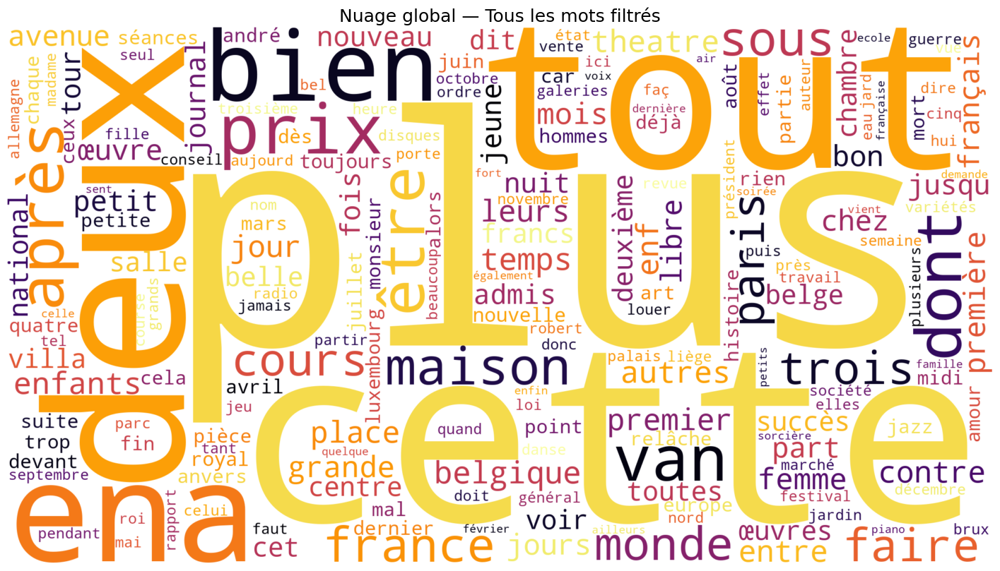

In [25]:
freq_global = Counter(corpus)

afficher_nuage(
    freq_global,
    titre="Nuage global — Tous les mots filtrés",
    save_path=f"{output_dir}nuage_global.png"
)


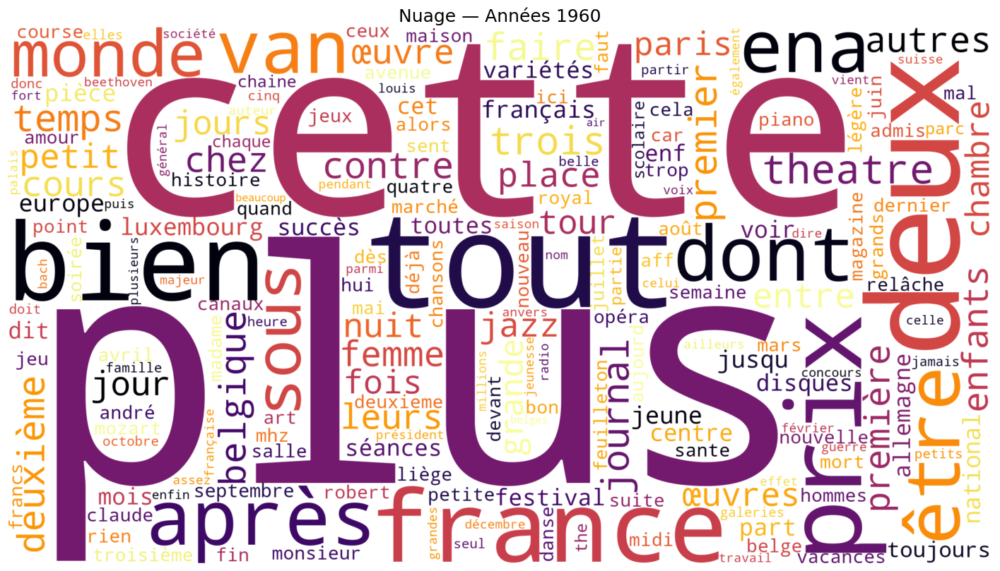

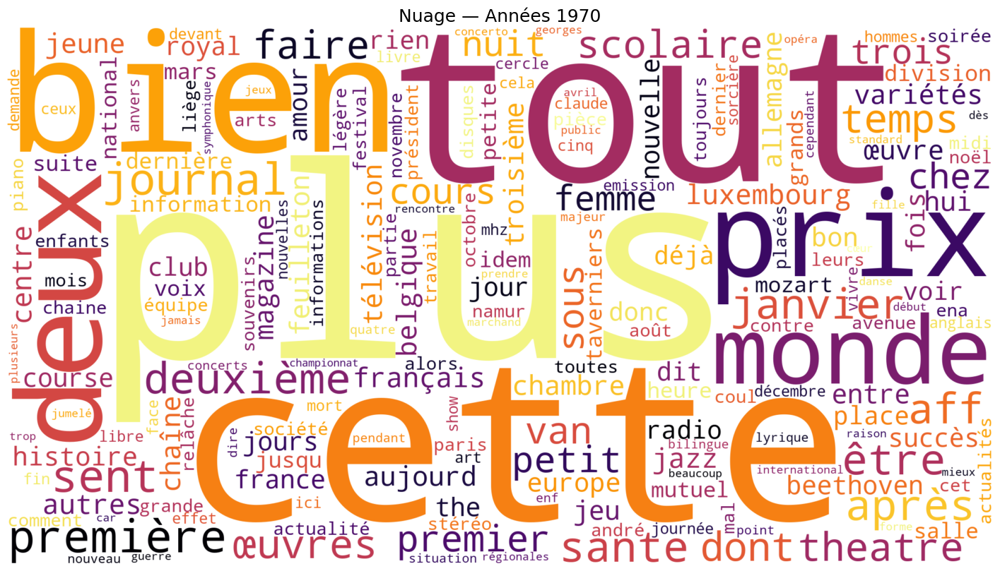

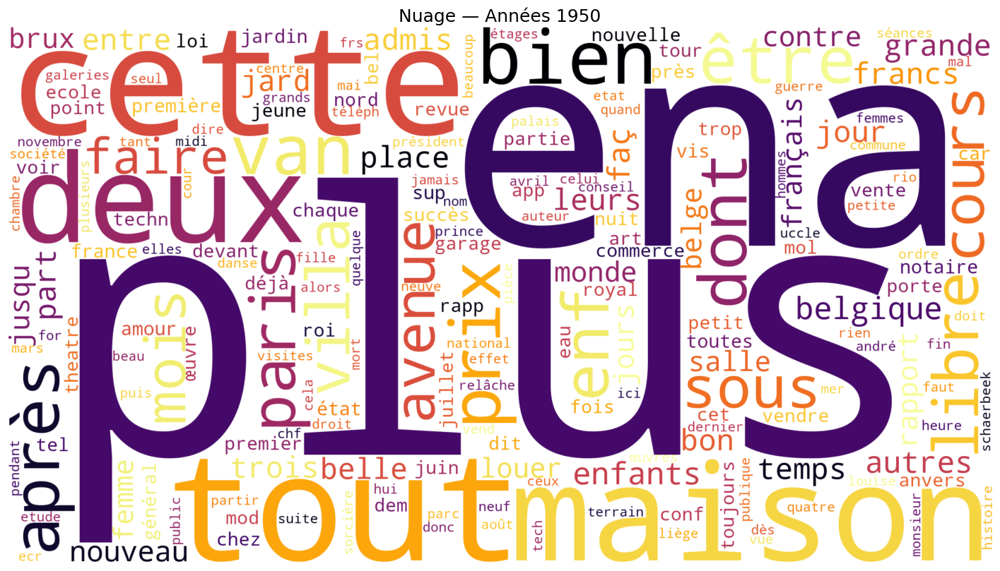

In [26]:
for dec, textes in corpus_decennies.items():
    words = " ".join(textes).split()
    freq = Counter(words)

    afficher_nuage(
        freq,
        titre=f"Nuage — Années {dec}",
        save_path=f"{output_dir}nuage_{dec}.png"
    )


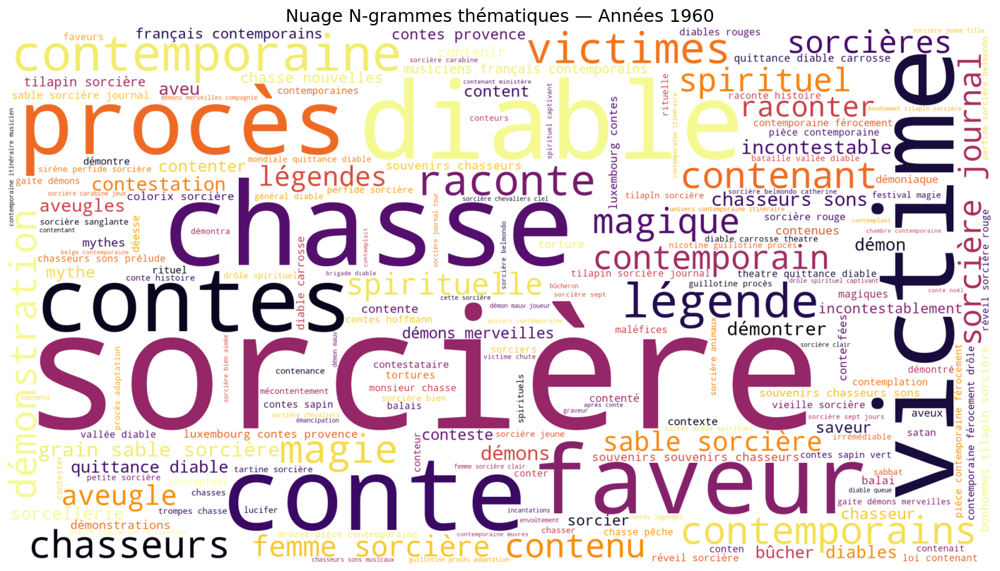

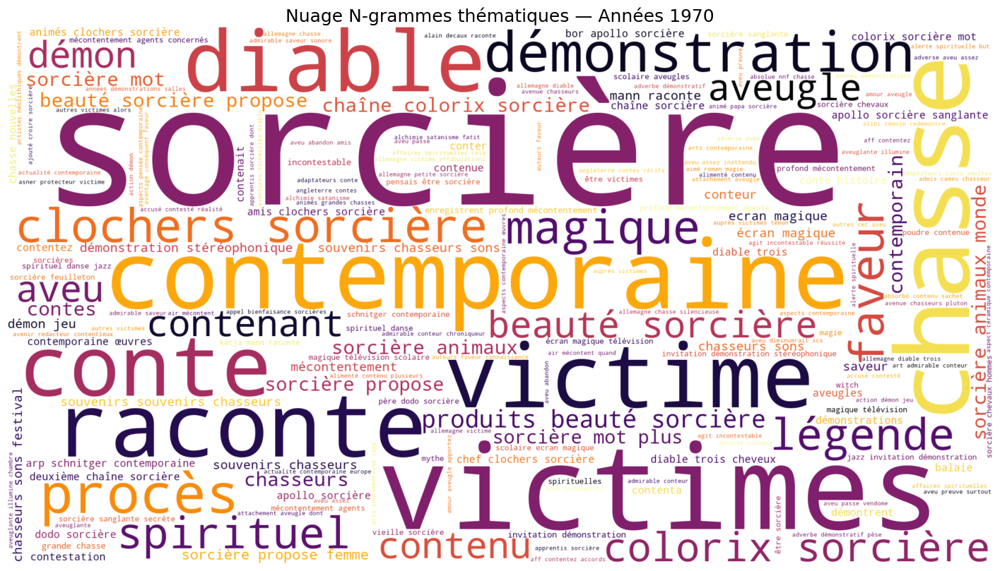

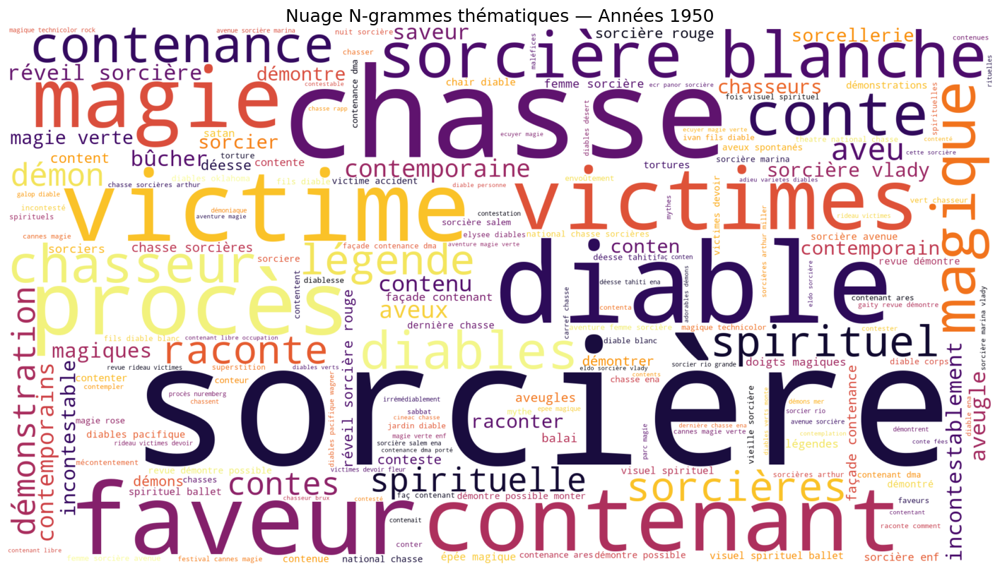

In [28]:
ngrams_decennies = {}

for dec, textes in corpus_decennies.items():
    combined = " ".join(textes)

    vectorizer = CountVectorizer(
        ngram_range=(1, 3),
        stop_words=list(stopwords_custom),
        min_df=1  
    )
    X = vectorizer.fit_transform([combined])

    feature_names = vectorizer.get_feature_names_out()
    counts = X.toarray()[0]

    # filtrage thématique
    ngram_counts = {
        feature_names[i]: counts[i]
        for i in range(len(feature_names))
        if any(m in feature_names[i] for m in mots_cibles)
    }

    ngrams_decennies[dec] = ngram_counts

    afficher_nuage(
        dict(sorted(ngram_counts.items(), key=lambda x: x[1], reverse=True)[:200]),
        titre=f"Nuage N-grammes thématiques — Années {dec}",
        save_path=f"{output_dir}ngrams_{dec}.png"
    )


In [29]:
with open(f"{output_dir}ngrams_thematiques.csv", "w", encoding="utf-8") as f:
    f.write("decennie;ngram;count\n")
    for dec, dico in ngrams_decennies.items():
        for ngram, count in dico.items():
            f.write(f"{dec};{ngram};{count}\n")


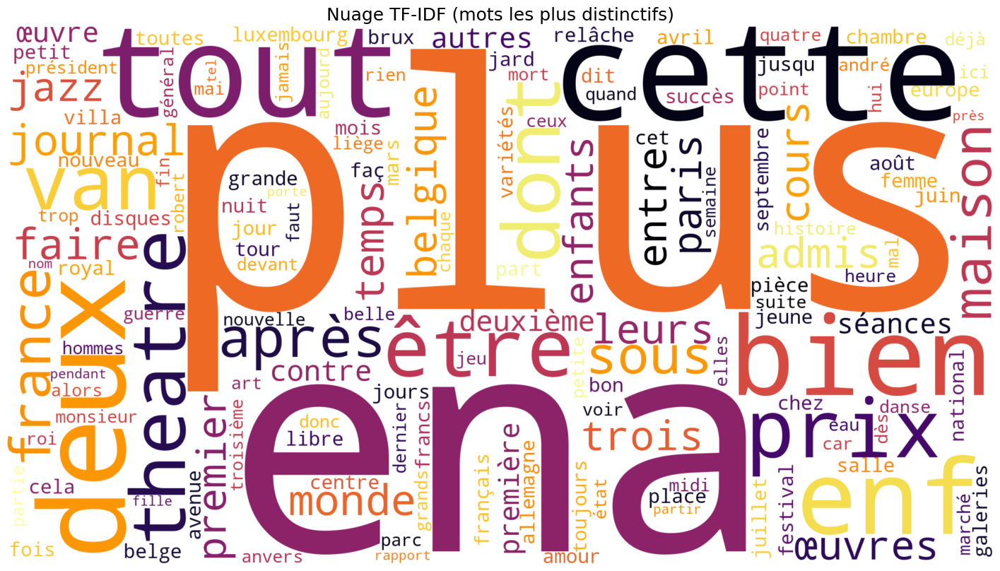

In [31]:
documents = [" ".join(filter_words(nettoyer_texte(open(os.path.join(data_path,f),'r',encoding='utf-8',errors='ignore').read()).split())) for f in files]

vectorizer = TfidfVectorizer(max_features=150)
X = vectorizer.fit_transform(documents)

# conversion correcte des valeurs
scores = X.toarray().mean(axis=0).astype(float)

tfidf_scores = dict(zip(vectorizer.get_feature_names_out(), scores))

# tri
tfidf_sorted = dict(sorted(tfidf_scores.items(), key=lambda x: x[1], reverse=True)[:150])

# affichage
afficher_nuage(
    tfidf_sorted,
    titre="Nuage TF-IDF (mots les plus distinctifs)",
    save_path=f"{output_dir}nuage_tfidf.png"
)



#  A effacrer

In [39]:
import os
import re
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt

import nltk
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

nltk.download("stopwords", quiet=True)

data_path = "../../data/txt_tp4"
output_dir = "../../data/results/"
os.makedirs(output_dir, exist_ok=True)


In [40]:
from nltk.corpus import stopwords

sw = set(stopwords.words("french"))

stopwords_extra = {
"plus","tout","toute","tous","toutes","tres","bien","encore","entre","sans","comme",
"faire","fait","ainsi","cela","celui","celle","ceux","celles","chaque","depuis",
"alors","apres","avant","tres","grand","grande","grands","grandes","peu","beaucoup",
"moins","souvent","toujours","jamais","rarement","vraiment","donc","car","mais",
"lors","pendant","ans","jours","fois","année","annees","hier","demain","matin","soir",
"parce","contre","avec","dans","sous","sur","entre","vers","chez","pour","par","dont",
"notre","votre","leur","leurs","mes","tes","ses","nos","vos","leurs",
"homme","femme","jeune","gens","personne","cas","monde","type","genre","niveau",
"ville","rue","quartier","bus","train","gare","prix","programme","heures",
"belga","afp","rossel",
}

# STOPWORDS FINAUX MASSIFS
stopwords_clean = sw | stopwords_extra

print("Stopwords :", len(stopwords_clean))


Stopwords : 235


In [41]:
mots_cibles = {
    "sorciere","sorcieres","sorcier","sorciers","sorcellerie",
    "magie","magique","magicien","rituel","rituels",
    "potion","malefice","envoutement","incantation","sabbat",
    "diable","demon","satan","lucifer",
    "exorcisme","inquisition","bucher","chasse","procès","torture",
    "feminisme","feministe","emancipation","sororite",
    "deesse","witch","witchcraft","macrale","superstition",
    "mythe","legende","croyance"
}


In [42]:
def nettoyer(t):
    t = t.lower()
    t = re.sub(r"[^\w\s\-àâäéèêëîïôöùûüç]", " ", t)
    t = re.sub(r"\d+", " ", t)
    return re.sub(r"\s+", " ", t).strip()


In [43]:
def filtrer(words):
    res = []
    for w in words:
        if w in mots_cibles:        # toujours garder
            res.append(w)
            continue
        if len(w) < 3:              # éviter "les", "des"
            continue
        if not w.isalpha():
            continue
        if w in stopwords_clean:    # enlever tout le bruit
            continue
        res.append(w)
    return res


In [44]:
def extract_year(fn):
    m = re.search(r"(19|20)\d{2}", fn)
    return int(m.group()) if m else None

corpus = []
corpus_decennies = {}

files = [f for f in os.listdir(data_path) if f.endswith(".txt")]

for f in files:
    y = extract_year(f)
    if y is None:
        continue
    dec = (y//10)*10

    txt = open(os.path.join(data_path, f), "r", encoding="utf-8", errors="ignore").read()
    txt = nettoyer(txt)
    words = filtrer(txt.split())

    corpus.extend(words)
    corpus_decennies.setdefault(dec, []).append(" ".join(words))

print("Décennies :", corpus_decennies.keys())
print("Total mots filtrés :", len(corpus))


Décennies : dict_keys([1960, 1970, 1950])
Total mots filtrés : 2518752


In [45]:
def nuage(freq, titre):
    wc = WordCloud(
        background_color="white",
        width=1800,
        height=1000,
        max_words=200,
        collocations=False,
        colormap="inferno"
    ).generate_from_frequencies(freq)

    plt.figure(figsize=(18,10))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(titre)
    plt.show()


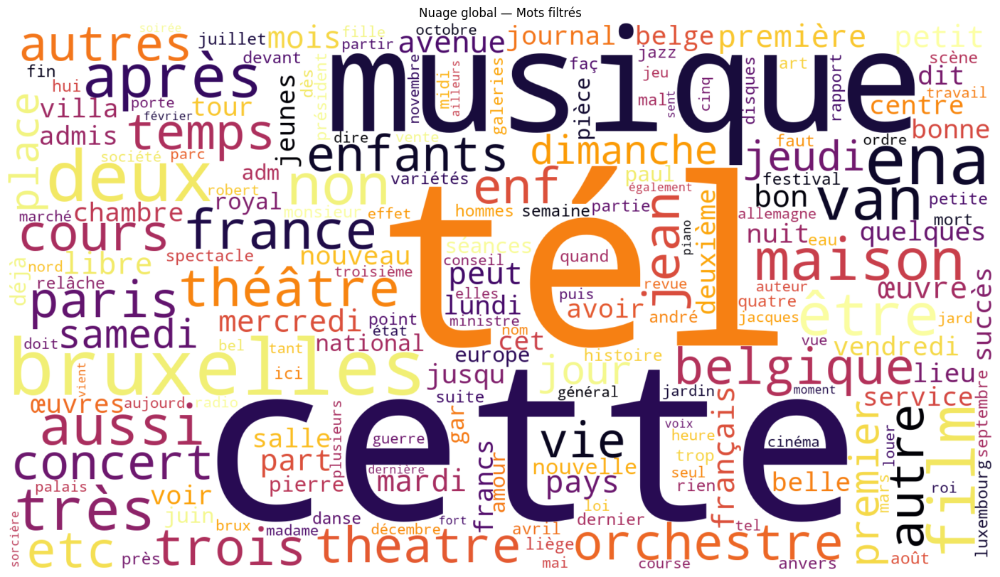

In [46]:
freq_global = Counter(corpus)
nuage(freq_global, "Nuage global — Mots filtrés")


In [50]:
wc = WordCloud(
    background_color="white",
    width=1800,
    height=1000,
    max_words=200,
    collocations=False
).generate_from_frequencies(freq)

# → Exporter les mots du nuage
words_in_cloud = wc.words_

print(list(words_in_cloud.keys()))


['tél', 'bruxelles', 'ena', 'cette', 'maison', 'deux', 'van', 'être', 'après', 'enf', 'très', 'libre', 'non', 'paris', 'gar', 'villa', 'aussi', 'cours', 'avenue', 'mois', 'belgique', 'enfants', 'musique', 'jeudi', 'faç', 'mardi', 'autres', 'bon', 'francs', 'autre', 'dimanche', 'samedi', 'jour', 'place', 'trois', 'adm', 'part', 'film', 'temps', 'vie', 'lundi', 'admis', 'jard', 'belle', 'peut', 'jean', 'nouveau', 'mercredi', 'pays', 'salle', 'rapport', 'vendredi', 'etc', 'théâtre', 'français', 'louer', 'brux', 'jusqu', 'belge', 'première', 'quelques', 'avoir', 'vis', 'jardin', 'notaire', 'france', 'sup', 'amour', 'état', 'spectacle', 'lieu', 'eau', 'cet', 'nouvelle', 'mod', 'œuvre', 'bel', 'premier', 'vente', 'juillet', 'petit', 'garage', 'anvers', 'loi', 'orchestre', 'bonne', 'dit', 'près', 'nord', 'royal', 'vendre', 'app', 'theatre', 'tour', 'rapp', 'juin', 'ecole', 'conf', 'roi', 'général', 'déjà', 'commerce', 'dem', 'partie', 'voir', 'revue', 'tel', 'succès', 'service', 'techn', 'mol

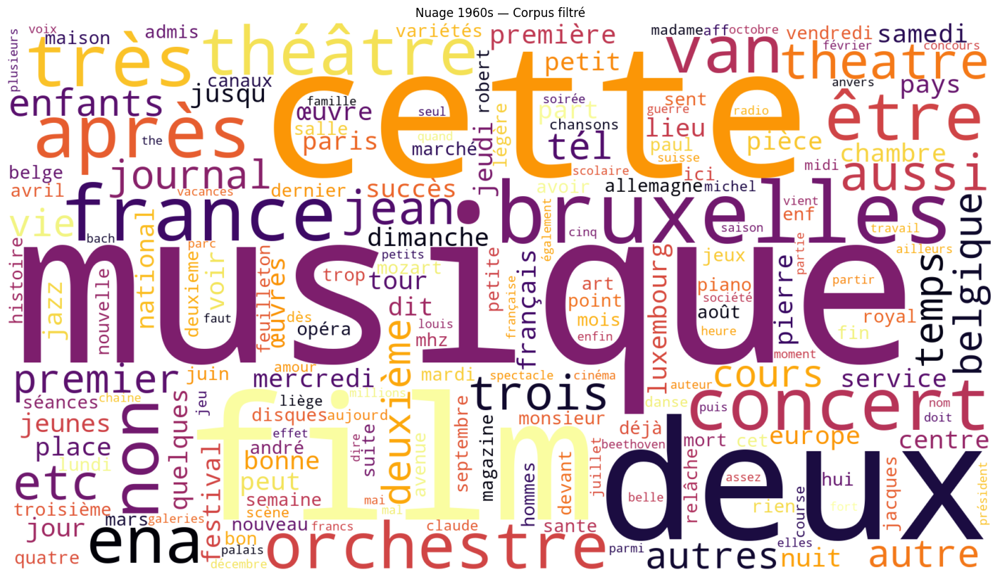

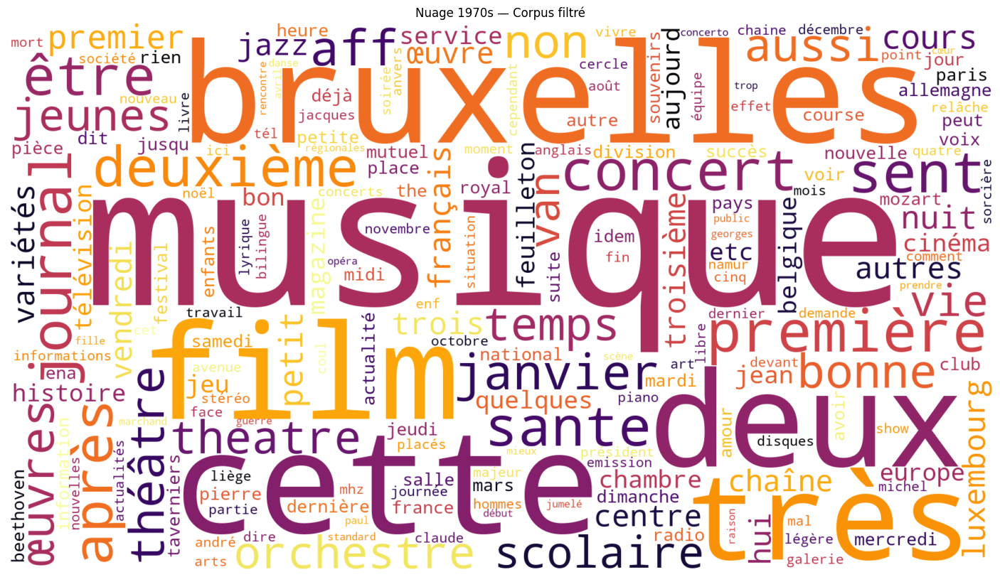

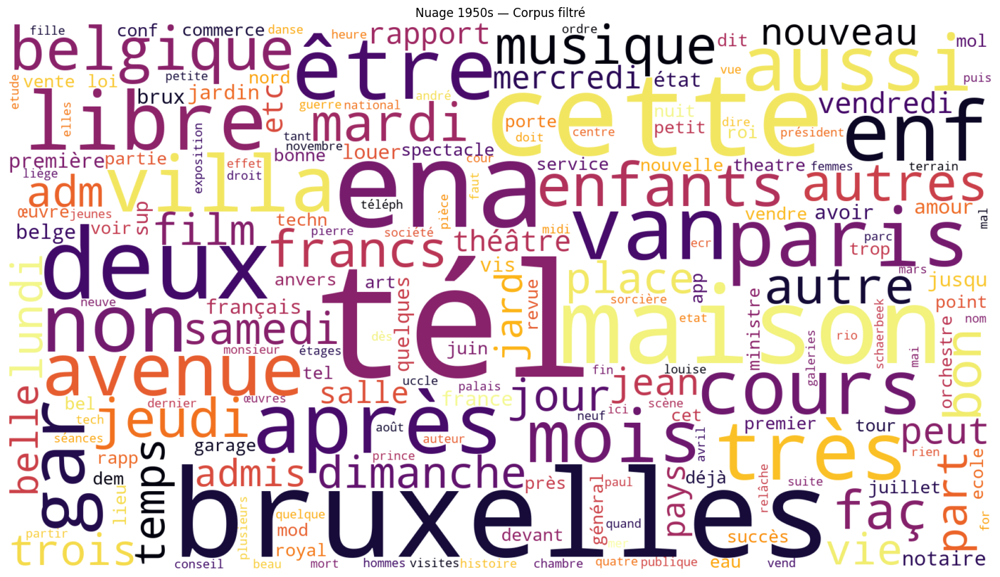

In [47]:
for dec, textes in corpus_decennies.items():
    words = " ".join(textes).split()
    freq = Counter(words)
    nuage(freq, f"Nuage {dec}s — Corpus filtré")


In [51]:
wc = WordCloud(
    background_color="white",
    width=1800,
    height=1000,
    max_words=200,
    collocations=False
).generate_from_frequencies(freq)

# → Exporter les mots du nuage
words_in_cloud = wc.words_

print(list(words_in_cloud.keys()))


['tél', 'bruxelles', 'ena', 'cette', 'maison', 'deux', 'van', 'être', 'après', 'enf', 'très', 'libre', 'non', 'paris', 'gar', 'villa', 'aussi', 'cours', 'avenue', 'mois', 'belgique', 'enfants', 'musique', 'jeudi', 'faç', 'mardi', 'autres', 'bon', 'francs', 'autre', 'dimanche', 'samedi', 'jour', 'place', 'trois', 'adm', 'part', 'film', 'temps', 'vie', 'lundi', 'admis', 'jard', 'belle', 'peut', 'jean', 'nouveau', 'mercredi', 'pays', 'salle', 'rapport', 'vendredi', 'etc', 'théâtre', 'français', 'louer', 'brux', 'jusqu', 'belge', 'première', 'quelques', 'avoir', 'vis', 'jardin', 'notaire', 'france', 'sup', 'amour', 'état', 'spectacle', 'lieu', 'eau', 'cet', 'nouvelle', 'mod', 'œuvre', 'bel', 'premier', 'vente', 'juillet', 'petit', 'garage', 'anvers', 'loi', 'orchestre', 'bonne', 'dit', 'près', 'nord', 'royal', 'vendre', 'app', 'theatre', 'tour', 'rapp', 'juin', 'ecole', 'conf', 'roi', 'général', 'déjà', 'commerce', 'dem', 'partie', 'voir', 'revue', 'tel', 'succès', 'service', 'techn', 'mol

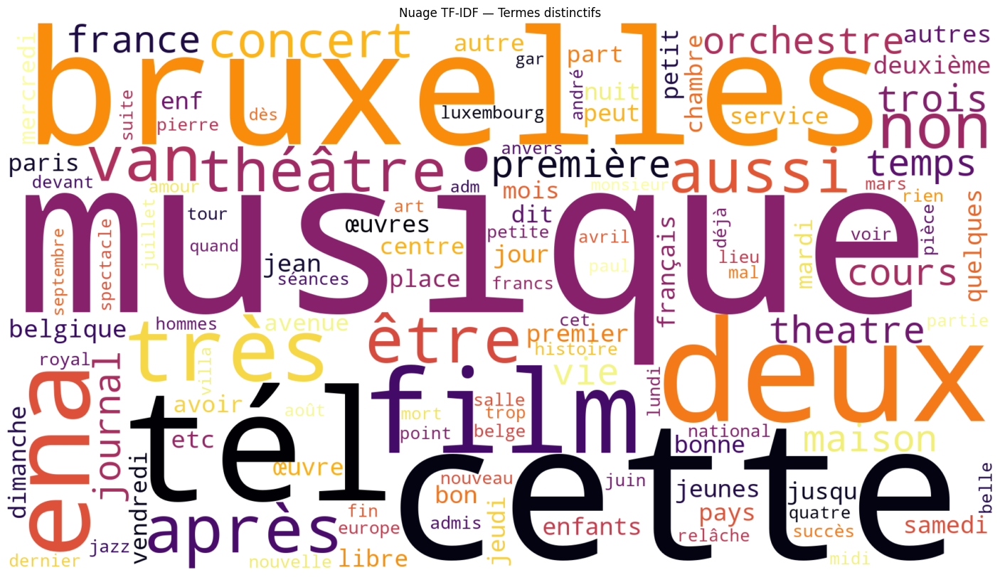

In [48]:
docs = list(corpus_decennies.values())
docs = [" ".join(d) for d in docs]

vect = TfidfVectorizer(max_features=120)
X = vect.fit_transform(docs)

scores = X.mean(axis=0).A1
tfidf = dict(zip(vect.get_feature_names_out(), scores))

nuage(tfidf, "Nuage TF-IDF — Termes distinctifs")


In [49]:
wc = WordCloud(
    background_color="white",
    width=1800,
    height=1000,
    max_words=200,
    collocations=False
).generate_from_frequencies(freq)

# → Exporter les mots du nuage
words_in_cloud = wc.words_

print(list(words_in_cloud.keys()))


['tél', 'bruxelles', 'ena', 'cette', 'maison', 'deux', 'van', 'être', 'après', 'enf', 'très', 'libre', 'non', 'paris', 'gar', 'villa', 'aussi', 'cours', 'avenue', 'mois', 'belgique', 'enfants', 'musique', 'jeudi', 'faç', 'mardi', 'autres', 'bon', 'francs', 'autre', 'dimanche', 'samedi', 'jour', 'place', 'trois', 'adm', 'part', 'film', 'temps', 'vie', 'lundi', 'admis', 'jard', 'belle', 'peut', 'jean', 'nouveau', 'mercredi', 'pays', 'salle', 'rapport', 'vendredi', 'etc', 'théâtre', 'français', 'louer', 'brux', 'jusqu', 'belge', 'première', 'quelques', 'avoir', 'vis', 'jardin', 'notaire', 'france', 'sup', 'amour', 'état', 'spectacle', 'lieu', 'eau', 'cet', 'nouvelle', 'mod', 'œuvre', 'bel', 'premier', 'vente', 'juillet', 'petit', 'garage', 'anvers', 'loi', 'orchestre', 'bonne', 'dit', 'près', 'nord', 'royal', 'vendre', 'app', 'theatre', 'tour', 'rapp', 'juin', 'ecole', 'conf', 'roi', 'général', 'déjà', 'commerce', 'dem', 'partie', 'voir', 'revue', 'tel', 'succès', 'service', 'techn', 'mol

# Dernier

In [52]:
import os
import re
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import nltk
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
import numpy as np

# Téléchargement NLTK
nltk.download("punkt", quiet=True)
nltk.download("stopwords", quiet=True)

data_path = "../../data/txt_tp4"
output_dir = "../../data/results/"
os.makedirs(output_dir, exist_ok=True)

# Stopwords de base
sw = set(stopwords.words("french"))

# Stopwords personnalisés – adaptés à TON corpus
stopwords_custom = sw | {
    # fragments (erreurs de nettoyage)
    "tél","enf","faç","jard","app","ecr","mod","rapp","conf","dem","mol",

    # mots grammaticaux
    "cette","cet","ces","ce","cela","leurs","lors","toute","tous","toutes",
    "deux","trois","quatre","cinq","plusieurs","quelques","quelque","tant",
    "aussi","très","non","autre","autres","déjà","peut","puis","doit",

    # adjectifs vides
    "grand","petit","petite","beau","belle","nouveau","nouvelle","premier","première",

    # espace médiatique belge
    "bruxelles","brux","belge","belgique","anvers","liège","uccle","paris","france","royal",
    "roi","ministre","président","pays","palais","national","etat","état",

    # journalisme
    "jour","année","mois","semaine","temps","faire","voir","dire","faut","fin","suite",
    "part","partie","point","effet","rôle","nom","cas","type","genre",

    # culture
    "musique","orchestre","théâtre","cinéma","film","concert","exposition","spectacle",
    "scène","salle","galeries","revue",

    # économie/administratif
    "loi","commerce","vente","vendre","service","terrain","notaire","prix","francs",

    # prénoms communs
    "jean","pierre","paul","andré","louise","monsieur"
}

# Mots thématiques (à garder!)
mots_cibles = {
    "sorcière","sorcières","sorcier","sorciers","sorcellerie","magie","magique",
    "rituel","potion","incantation","maléfice","envoûtement","diable","démon","satan",
    "lucifer","exorcisme","sabbat","balai",
    "féminisme","féministe","féministes","sororité","émancipation","witch","witchcraft",
    "procès","torture","bûcher","inquisition","persécution","chasse","aveu","aveux",
    "macrale","conte","mythe","légende","superstition"
}


In [53]:
def nettoyer_texte(text):
    text = text.lower()
    text = re.sub(r"[^\w\sàâäéèêëîïôöùûüç-]", " ", text)
    text = re.sub(r"\d+", " ", text)
    text = re.sub(r"\b\w{1,2}\b", " ", text)
    text = re.sub(r"\s+", " ", text).strip()
    return text

def filter_words(words):
    # conserver mots thématiques même s’ils ressemblent à des stopwords
    return [
        w for w in words
        if (w not in stopwords_custom) or (w in mots_cibles)
    ]

def extract_year(filename):
    # Format : KB_JB838_1966-08-03_01-00008.txt
    match = re.search(r"(19|20)\d{2}-\d{2}-\d{2}", filename)
    if match:
        return int(match.group(0)[:4])
    return None


In [54]:
files = [f for f in os.listdir(data_path) if f.endswith(".txt")]

corpus = []
corpus_decennies = {}

for f in files:
    year = extract_year(f)
    if year is None:
        continue

    dec = (year // 10) * 10

    with open(os.path.join(data_path, f), "r", encoding="utf-8", errors="ignore") as ff:
        text = nettoyer_texte(ff.read())

    words = filter_words(text.split())
    filtered_text = " ".join(words)

    corpus.extend(words)
    corpus_decennies.setdefault(dec, []).append(filtered_text)

print("Décennies :", sorted(corpus_decennies.keys()))
print("Taille corpus global :", len(corpus))


Décennies : [1950, 1960, 1970]
Taille corpus global : 2642827


In [55]:
def afficher_nuage(frequencies, titre="", save_path=None):
    if len(frequencies) == 0:
        print("⚠ Aucun élément à afficher.")
        return

    wc = WordCloud(
        width=2200,
        height=1200,
        background_color="white",
        colormap="inferno",
        max_words=100,
        prefer_horizontal=0.85,
        collocations=False
    ).generate_from_frequencies(frequencies)

    plt.figure(figsize=(17,10))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(titre, fontsize=20)

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")

    plt.show()


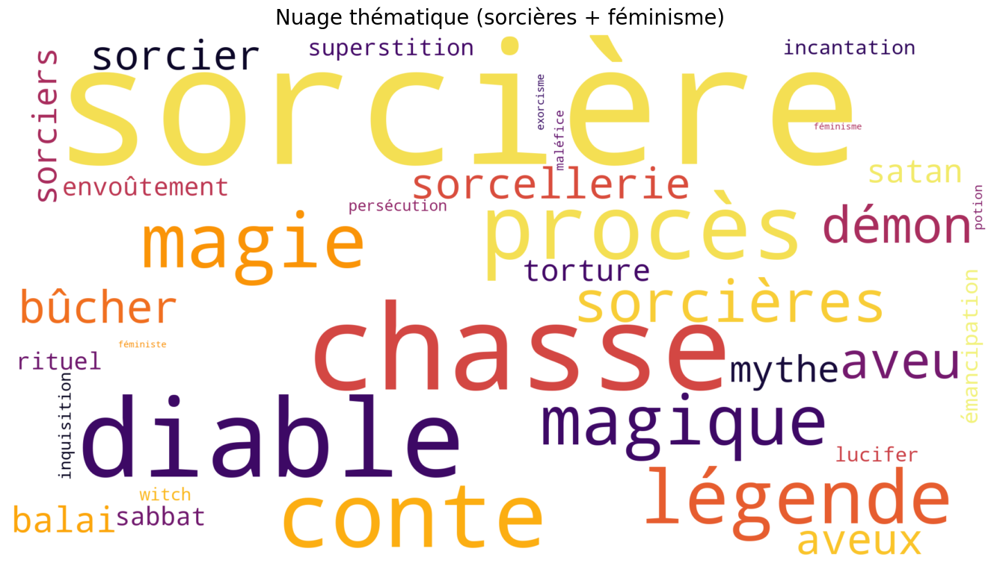

In [56]:
freq = Counter(corpus)

nuage_thematique = {
    mot: freq[mot] for mot in mots_cibles if mot in freq
}

afficher_nuage(
    nuage_thematique,
    titre="Nuage thématique (sorcières + féminisme)",
    save_path=f"{output_dir}nuage_thematique.png"
)


In [61]:
wc = WordCloud(
    background_color="white",
    width=1800,
    height=1000,
    max_words=200,
    collocations=False
).generate_from_frequencies(freq)

# → Exporter les mots du nuage
words_in_cloud = wc.words_

print(list(words_in_cloud.keys()))


['-', 'plus', 'rue', 'ena', 'tout', 'maison', 'comme', 'sans', 'bien', 'fait', 'van', 'être', 'dont', 'après', 'rossel', 'heures', 'libre', 'ans', 'soir', 'gar', 'villa', 'cours', 'sous', 'encore', 'avenue', 'enfants', 'jeudi', 'mardi', 'peu', 'bon', 'grande', 'dimanche', 'samedi', 'entre', 'homme', 'place', 'adm', 'vie', 'lundi', 'admis', 'ainsi', 'mercredi', 'ville', 'monde', 'contre', 'rapport', 'vendredi', 'jours', 'etc', 'français', 'louer', 'jusqu', 'moins', 'vers', 'femme', 'depuis', 'avoir', 'vis', 'jardin', 'sup', 'amour', 'avant', 'lieu', 'eau', 'jeune', 'œuvre', 'bel', 'fois', 'juillet', 'garage', 'bonne', 'dit', 'près', 'chez', 'nord', 'car', 'theatre', 'tour', 'juin', 'toujours', 'ecole', 'général', 'tel', 'succès', 'techn', 'chaque', 'art', 'nuit', 'devant', 'trop', 'porte', 'jamais', 'quand', 'rien', 'fille', 'mal', 'avril', 'guerre', 'hommes', 'dès', 'mars', 'alors', 'ceux', 'téléph', 'vue', 'parc', 'centre', 'relâche', 'midi', 'mai', 'programme', 'heure', 'elles', 'pub

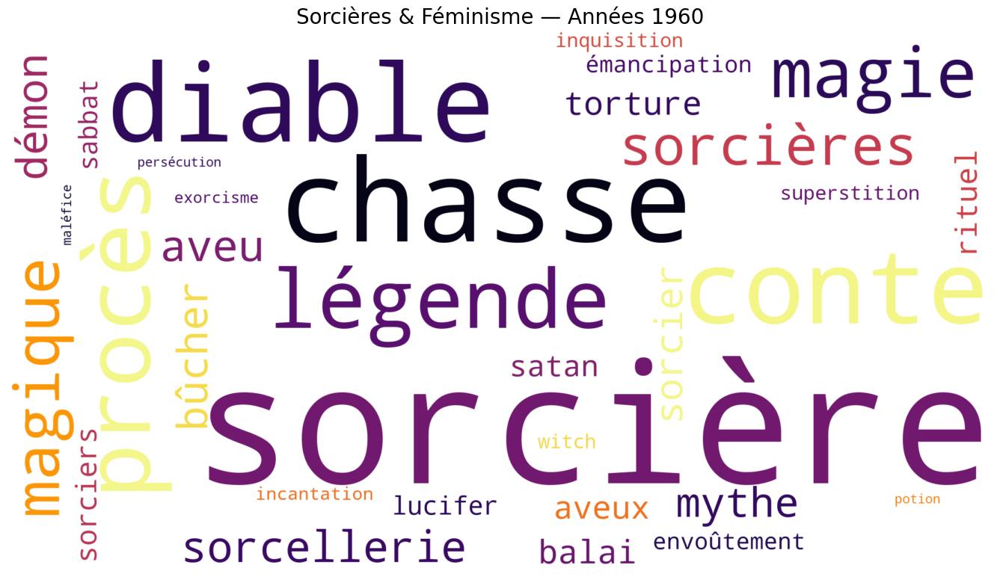

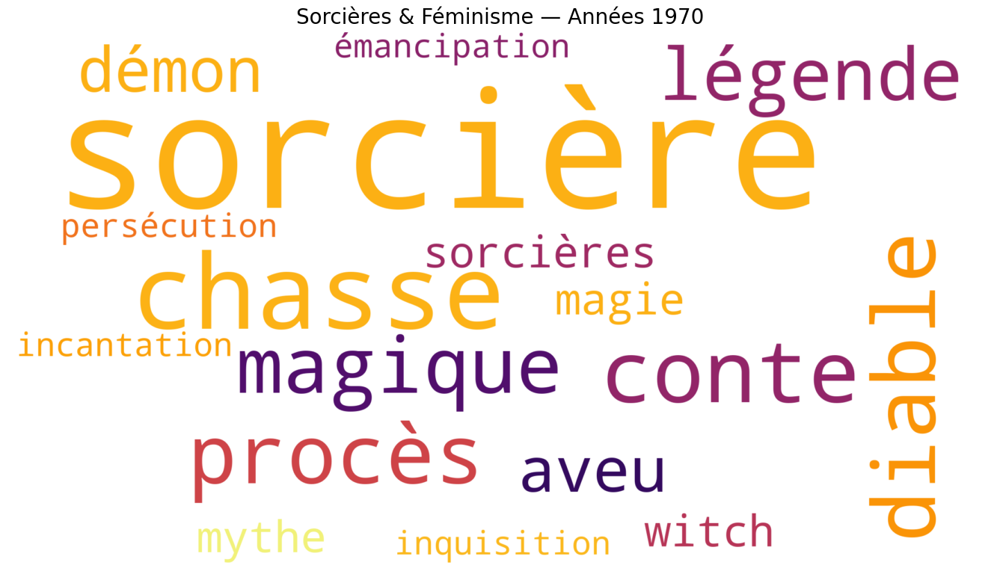

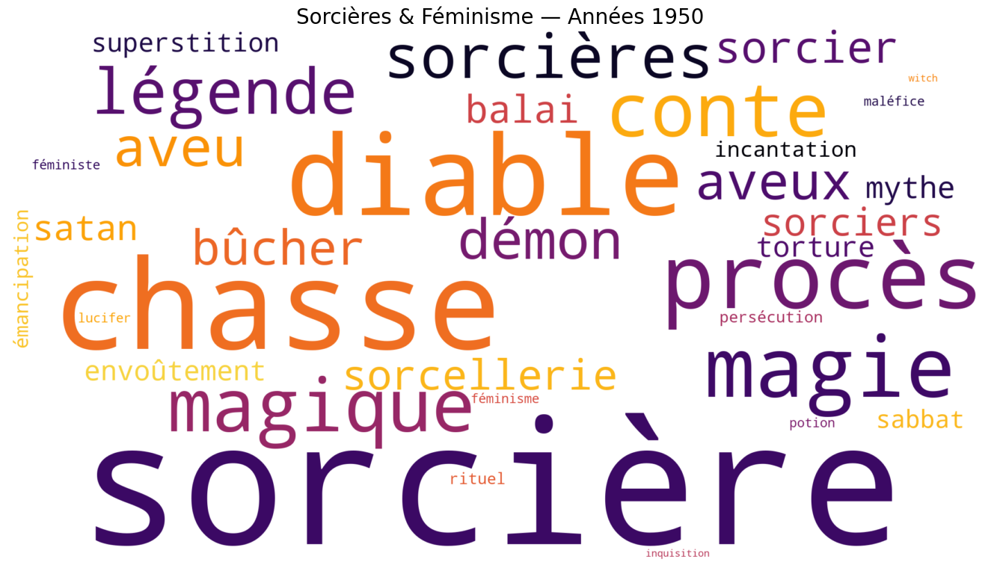

In [57]:
for dec, textes in corpus_decennies.items():
    words = " ".join(textes).split()
    freq = Counter(words)

    freq_thematique = {mot: freq[mot] for mot in mots_cibles if mot in freq}

    afficher_nuage(
        freq_thematique,
        titre=f"Sorcières & Féminisme — Années {dec}",
        save_path=f"{output_dir}nuage_theme_{dec}.png"
    )


In [62]:
wc = WordCloud(
    background_color="white",
    width=1800,
    height=1000,
    max_words=200,
    collocations=False
).generate_from_frequencies(freq)

# → Exporter les mots du nuage
words_in_cloud = wc.words_

print(list(words_in_cloud.keys()))


['-', 'plus', 'rue', 'ena', 'tout', 'maison', 'comme', 'sans', 'bien', 'fait', 'van', 'être', 'dont', 'après', 'rossel', 'heures', 'libre', 'ans', 'soir', 'gar', 'villa', 'cours', 'sous', 'encore', 'avenue', 'enfants', 'jeudi', 'mardi', 'peu', 'bon', 'grande', 'dimanche', 'samedi', 'entre', 'homme', 'place', 'adm', 'vie', 'lundi', 'admis', 'ainsi', 'mercredi', 'ville', 'monde', 'contre', 'rapport', 'vendredi', 'jours', 'etc', 'français', 'louer', 'jusqu', 'moins', 'vers', 'femme', 'depuis', 'avoir', 'vis', 'jardin', 'sup', 'amour', 'avant', 'lieu', 'eau', 'jeune', 'œuvre', 'bel', 'fois', 'juillet', 'garage', 'bonne', 'dit', 'près', 'chez', 'nord', 'car', 'theatre', 'tour', 'juin', 'toujours', 'ecole', 'général', 'tel', 'succès', 'techn', 'chaque', 'art', 'nuit', 'devant', 'trop', 'porte', 'jamais', 'quand', 'rien', 'fille', 'mal', 'avril', 'guerre', 'hommes', 'dès', 'mars', 'alors', 'ceux', 'téléph', 'vue', 'parc', 'centre', 'relâche', 'midi', 'mai', 'programme', 'heure', 'elles', 'pub

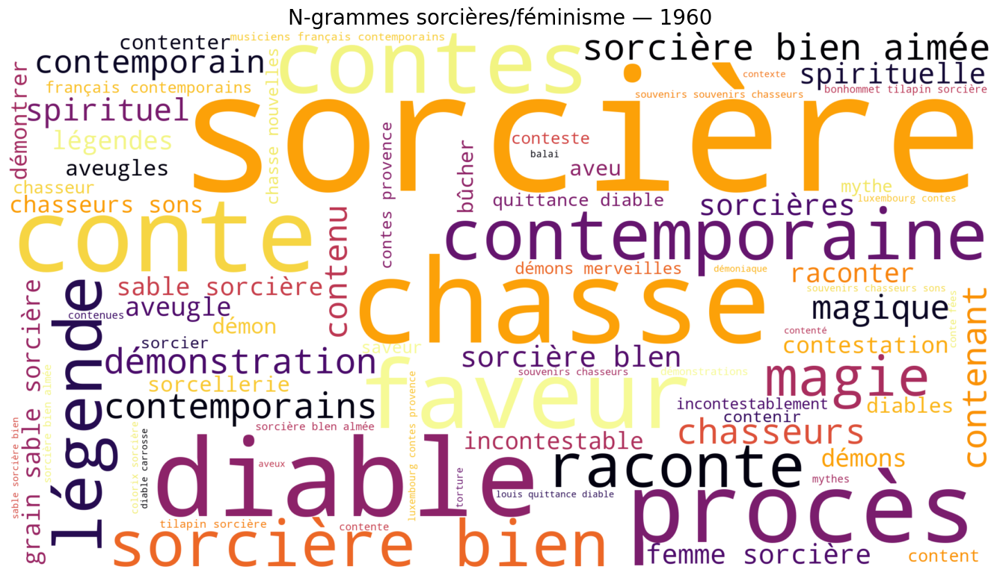

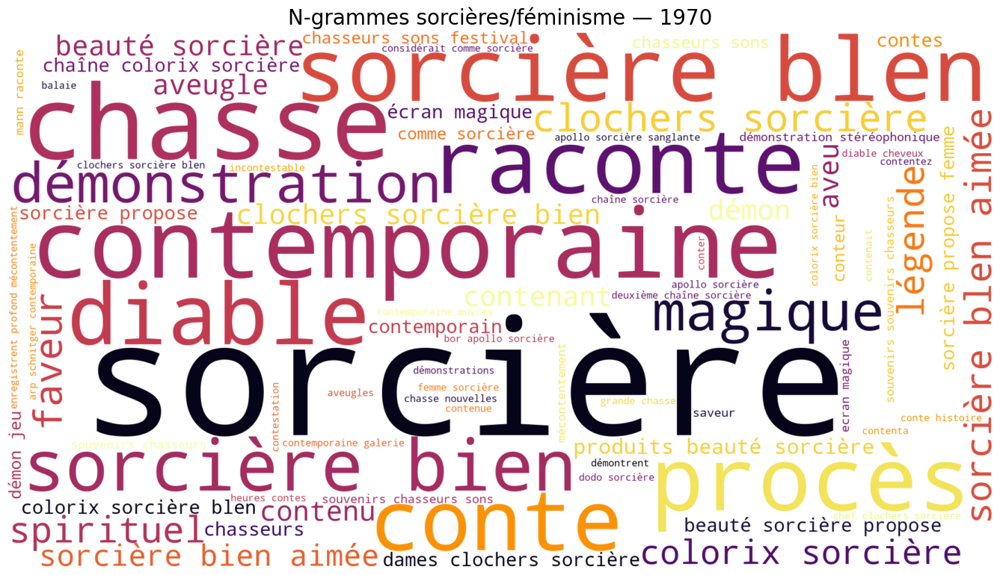

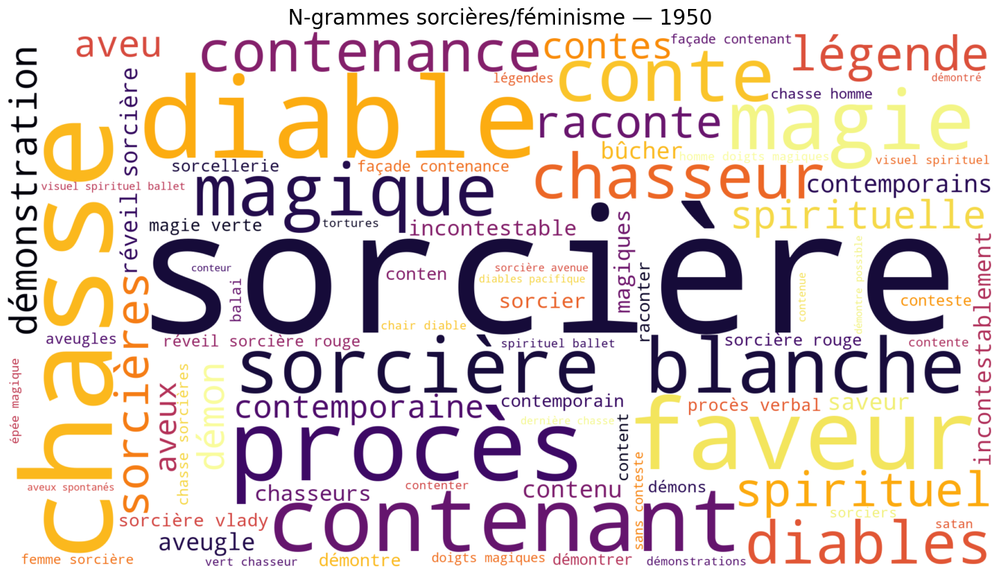

In [58]:
ngrams_decennies = {}

for dec, textes in corpus_decennies.items():
    combined = " ".join(textes)

    vectorizer = CountVectorizer(
        ngram_range=(1, 3),
        stop_words=list(stopwords_custom),
        min_df=1
    )
    X = vectorizer.fit_transform([combined])

    feature_names = vectorizer.get_feature_names_out()
    counts = X.toarray()[0]

    ngram_counts = {
        feature_names[i]: counts[i]
        for i in range(len(feature_names))
        if any(m in feature_names[i] for m in mots_cibles)
    }

    ngrams_decennies[dec] = ngram_counts

    afficher_nuage(
        dict(sorted(ngram_counts.items(), key=lambda x: x[1], reverse=True)[:80]),
        titre=f"N-grammes sorcières/féminisme — {dec}",
        save_path=f"{output_dir}ngrams_thematiques_{dec}.png"
    )


In [59]:
with open(f"{output_dir}ngrams_thematiques.csv", "w", encoding="utf-8") as f:
    f.write("decennie;ngram;count\n")
    for dec, dico in ngrams_decennies.items():
        for ngram, count in dico.items():
            f.write(f"{dec};{ngram};{count}\n")


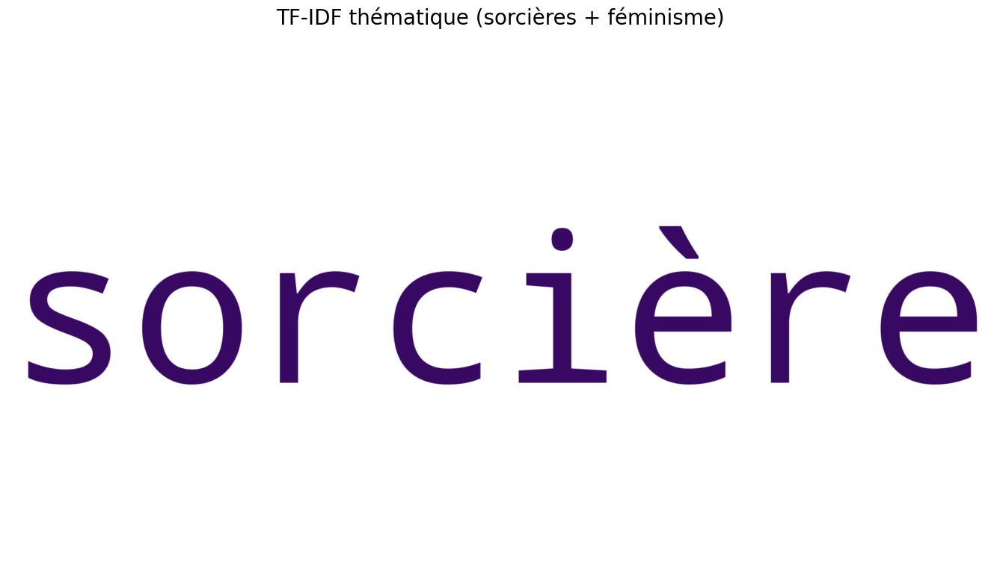

In [60]:
documents = [" ".join(filter_words(nettoyer_texte(
    open(os.path.join(data_path,f),'r',encoding='utf-8',errors='ignore').read()
).split())) for f in files]

vectorizer = TfidfVectorizer(max_features=200)
X = vectorizer.fit_transform(documents)

scores = X.toarray().mean(axis=0).astype(float)

tfidf_scores = dict(zip(vectorizer.get_feature_names_out(), scores))

# filtrage strict : seulement vocabulaire thématique
tfidf_thematique = {
    mot: tfidf_scores[mot]
    for mot in tfidf_scores
    if mot in mots_cibles
}

afficher_nuage(
    tfidf_thematique,
    titre="TF-IDF thématique (sorcières + féminisme)",
    save_path=f"{output_dir}nuage_tfidf_thematique.png"
)
